In [1]:
import edge_detection as ed
import matplotlib.pyplot as plt
import numpy as np

In [2]:
image = plt.imread('99370264_p0.png')

# Sample Guassian Blur Usage
kernel_size = 5
sigma = 1.0
gray_image = ed.rgb_to_gray(image)

blurred_image = ed.gaussian_blur(gray_image, kernel_size, sigma)

# plt.figure(dpi = 300)
# plt.subplot(121), plt.imshow(image), plt.title('Original Image')
# plt.subplot(122), plt.imshow(blurred_image, cmap = "gray"), plt.title('Blurred Image')
# plt.show()

[ 0.15428077  0.34571923 -0.         -0.34571923 -0.15428077]


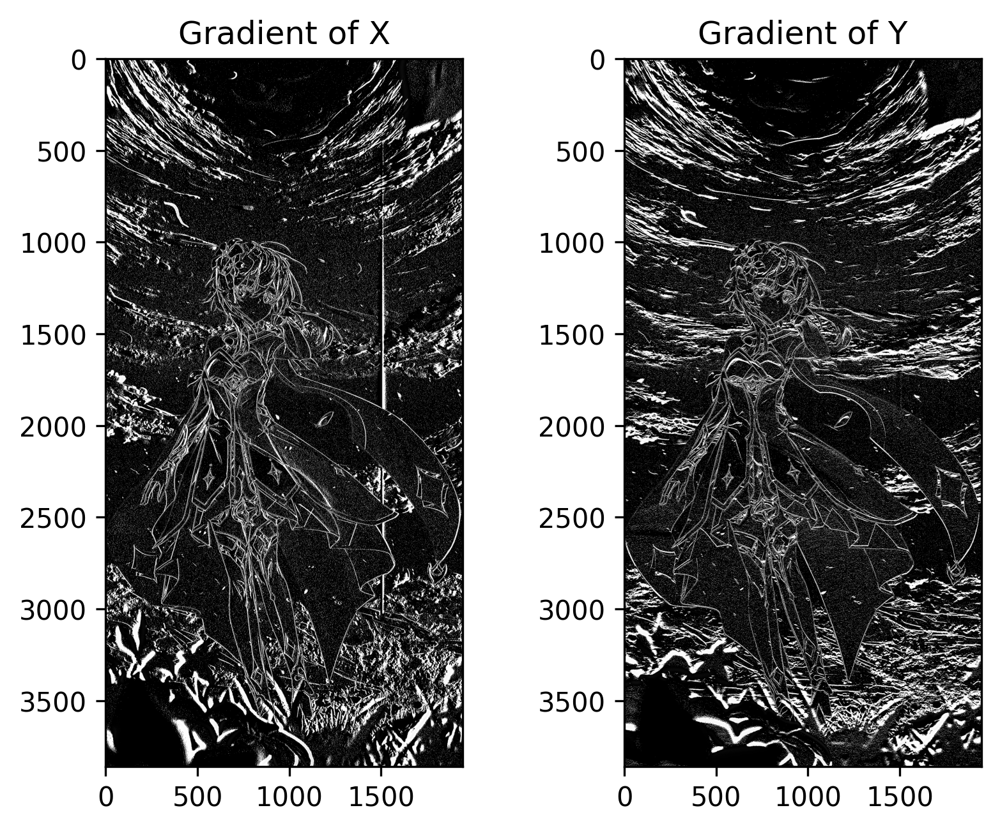

In [3]:
image_red_channel = image[..., 0]

# 生成一维高斯差分滤波器
sigma = 1.0
size = 5
gaussian_derivative_kernel = ed.gaussian_derivative_kernel(size, sigma, order=1)

print(gaussian_derivative_kernel)

# 在图像上应用高斯差分滤波器
gradient_x, gradient_y = ed.apply_gradient_operator(gray_image, gaussian_derivative_kernel)

plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(gradient_x, cmap = "gray"), plt.title("Gradient of X")
plt.subplot(122), plt.imshow(gradient_y, cmap = "gray"), plt.title("Gradient of Y")
plt.show()

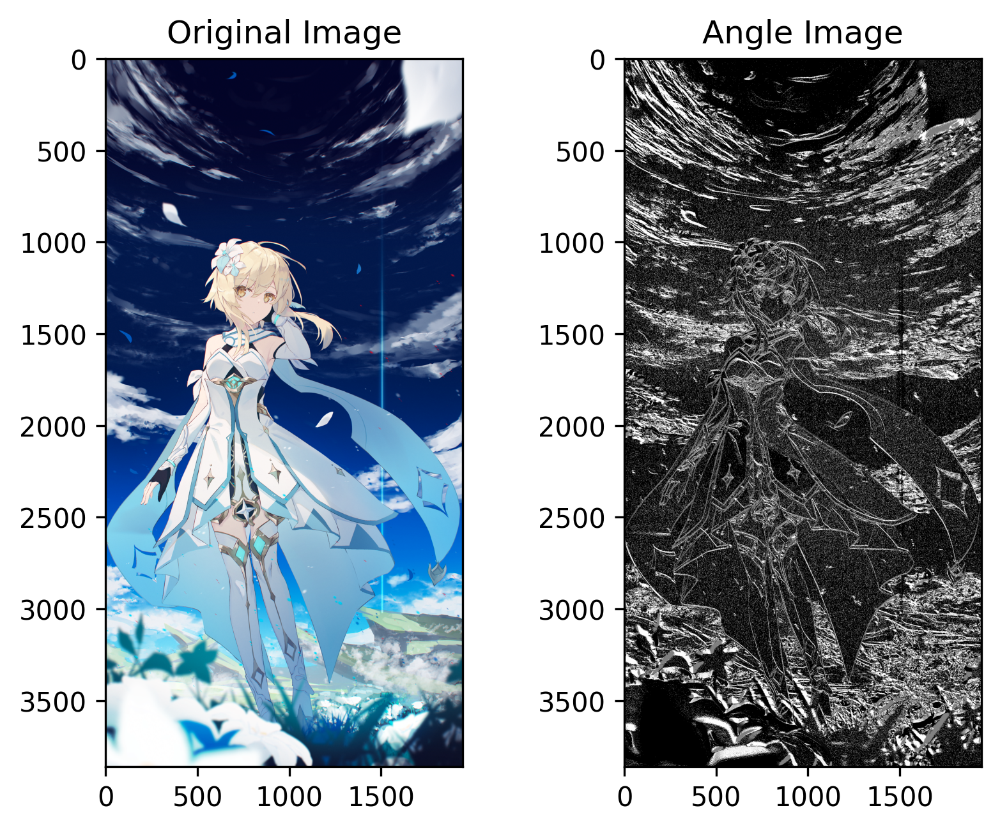

In [4]:
angle_image = ed.calculate_angle_image(gradient_x, gradient_y)

plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(image), plt.title('Original Image')
plt.subplot(122), plt.imshow(angle_image, cmap = "gray"), plt.title('Angle Image')
plt.show()

In [5]:
print(angle_image)

[[0.7773   1.57     1.559    ... 1.57     0.003937 0.00784 ]
 [1.5625   1.555    1.555    ... 1.57     1.57     1.57    ]
 [1.5625   0.       0.       ... 0.       0.       0.      ]
 ...
 [0.       0.       1.566    ... 0.       0.       1.57    ]
 [0.       0.       1.57     ... 0.       0.       1.57    ]
 [0.       0.       0.       ... 0.       0.       0.      ]]


/data/lab/Lane_Line_Detection/edge_detection.py:68: RuntimeWarning: divide by zero encountered in divide
  t = 1 / t


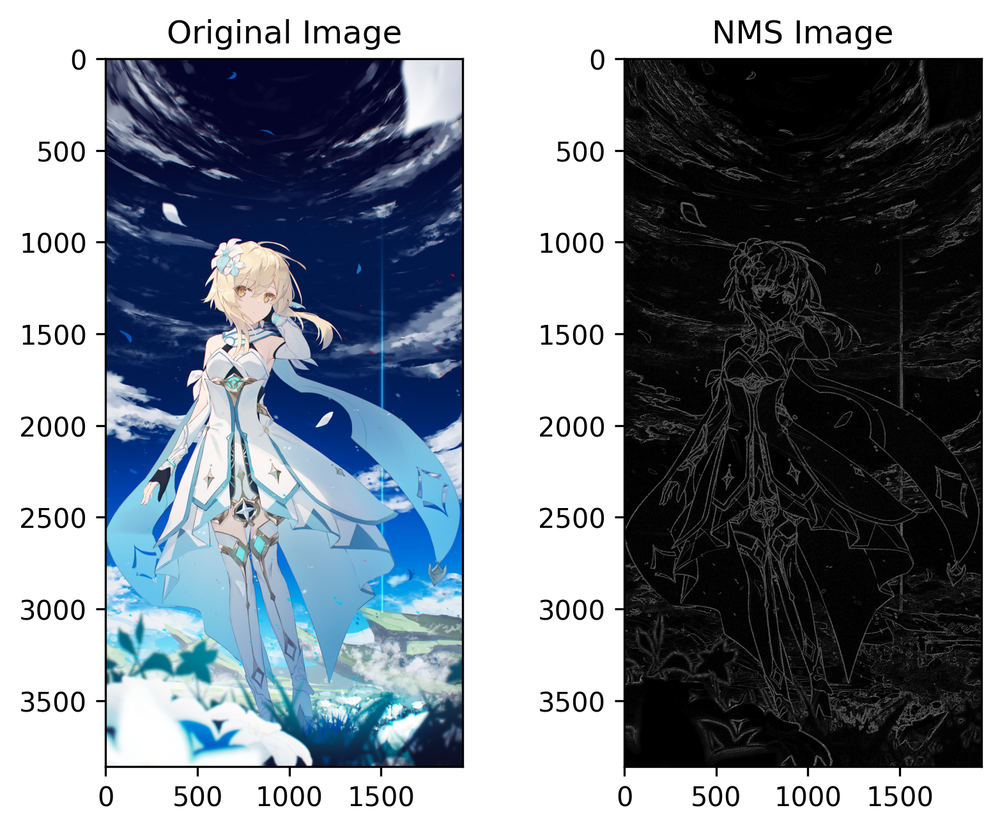

In [6]:
nms_image = ed.non_max_suppression(gradient_x, gradient_y)

plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(image), plt.title('Original Image')
plt.subplot(122), plt.imshow(nms_image, cmap = "gray"), plt.title('NMS Image')
plt.show()

In [7]:
print(np.sum(nms_image == 0))

5712503


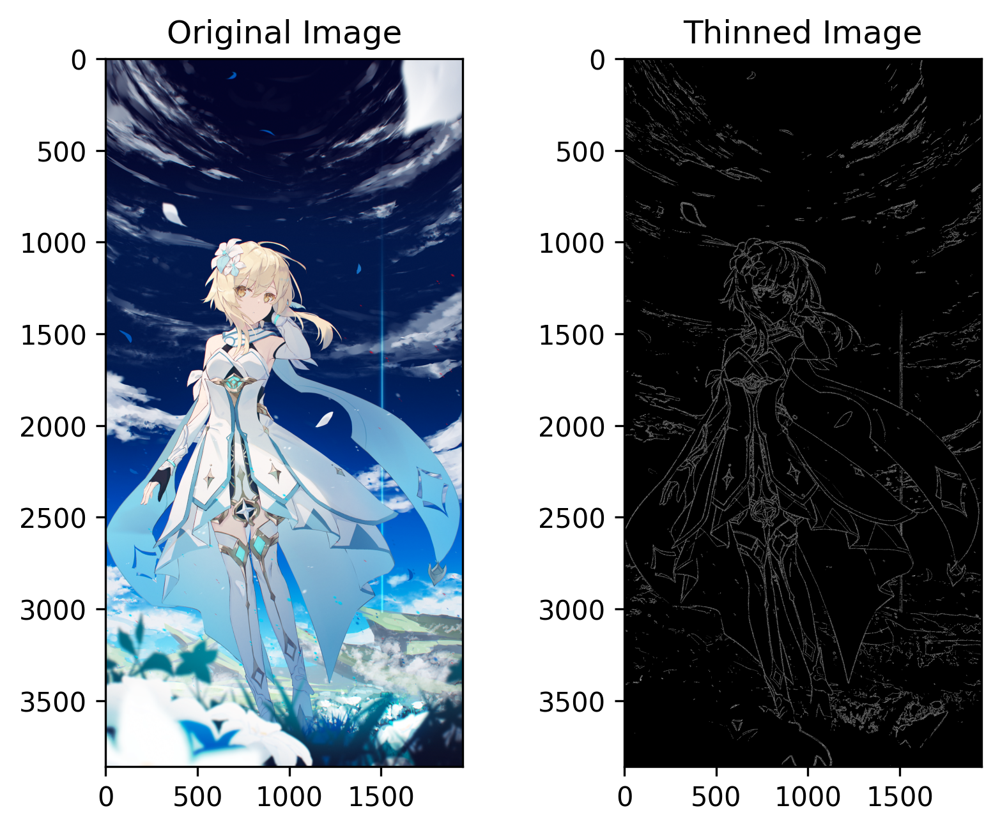

In [14]:
thin_image = ed.thinning_double_threshold(nms_image, 10, 13)

plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(image), plt.title('Original Image')
plt.subplot(122), plt.imshow(thin_image, cmap = "gray"), plt.title('Thinned Image')
plt.show()

In [19]:
print(thin_image.size, np.sum(thin_image == 255), np.sum(thin_image == 0))

7507700 198134 7309566


In [ ]:
import cv2

libpng warning: iCCP: known incorrect sRGB profile


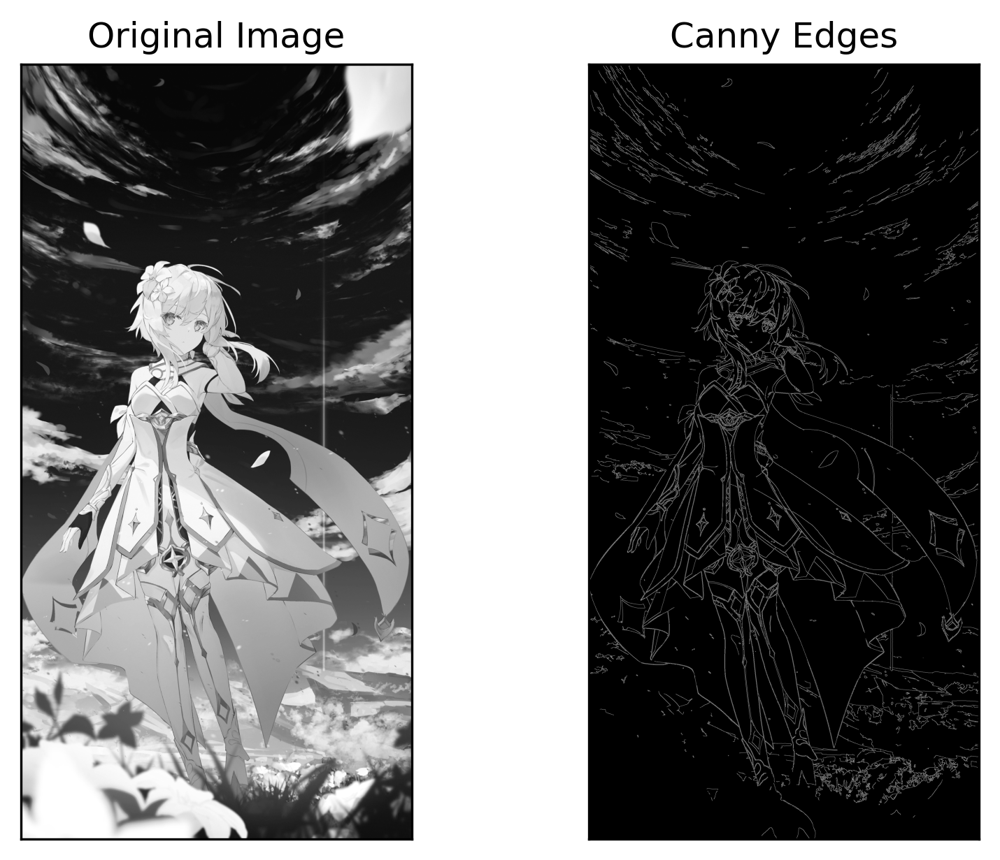

In [10]:
cv_image = cv2.imread('99370264_p0.png', cv2.IMREAD_GRAYSCALE)
edges = cv2.Canny(cv_image, 50, 150)

# 显示原始图像和边缘检测结果
plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(gray_image, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(edges, cmap='gray')
plt.title('Canny Edges'), plt.xticks([]), plt.yticks([])

plt.show()

In [18]:
print(np.max(edges))
print(edges.size, np.sum(edges == 255), np.sum(edges == 0))

255
7507700 210229 7297471


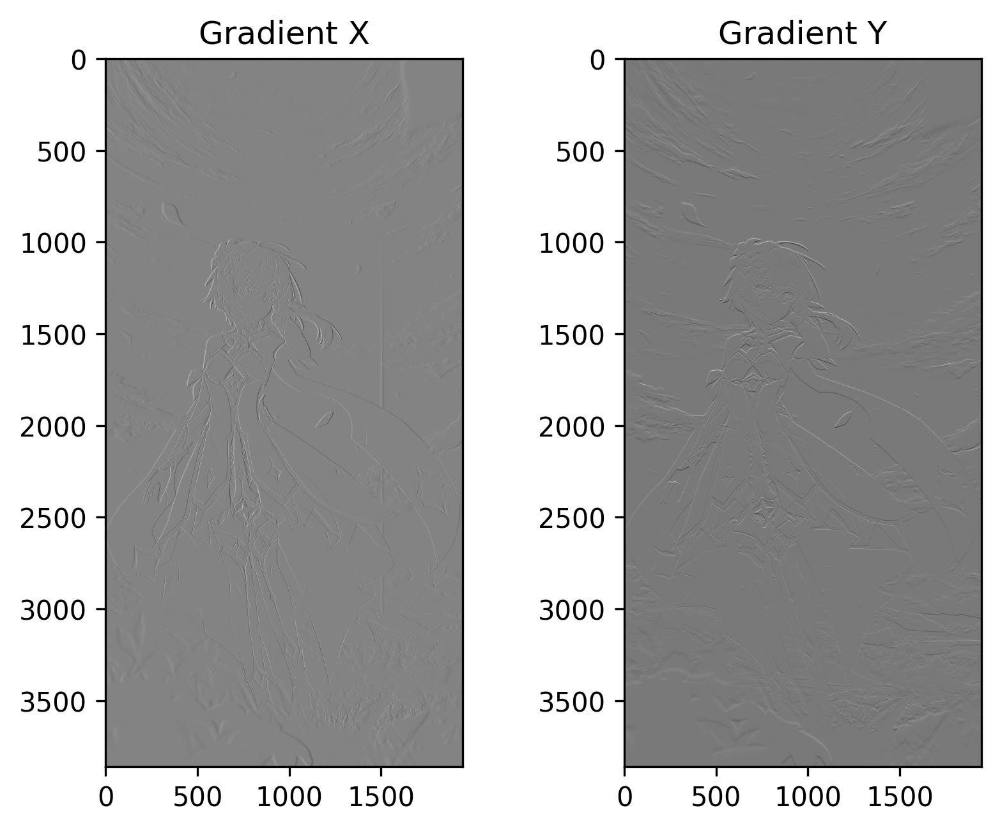

In [11]:
gradient_x = cv2.Sobel(cv_image, cv2.CV_64F, 1, 0, ksize=3)
gradient_y = cv2.Sobel(cv_image, cv2.CV_64F, 0, 1, ksize=3)

plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(gradient_x, cmap = "gray"), plt.title('Gradient X')
plt.subplot(122), plt.imshow(gradient_y, cmap = "gray"), plt.title('Gradient Y')
plt.show()

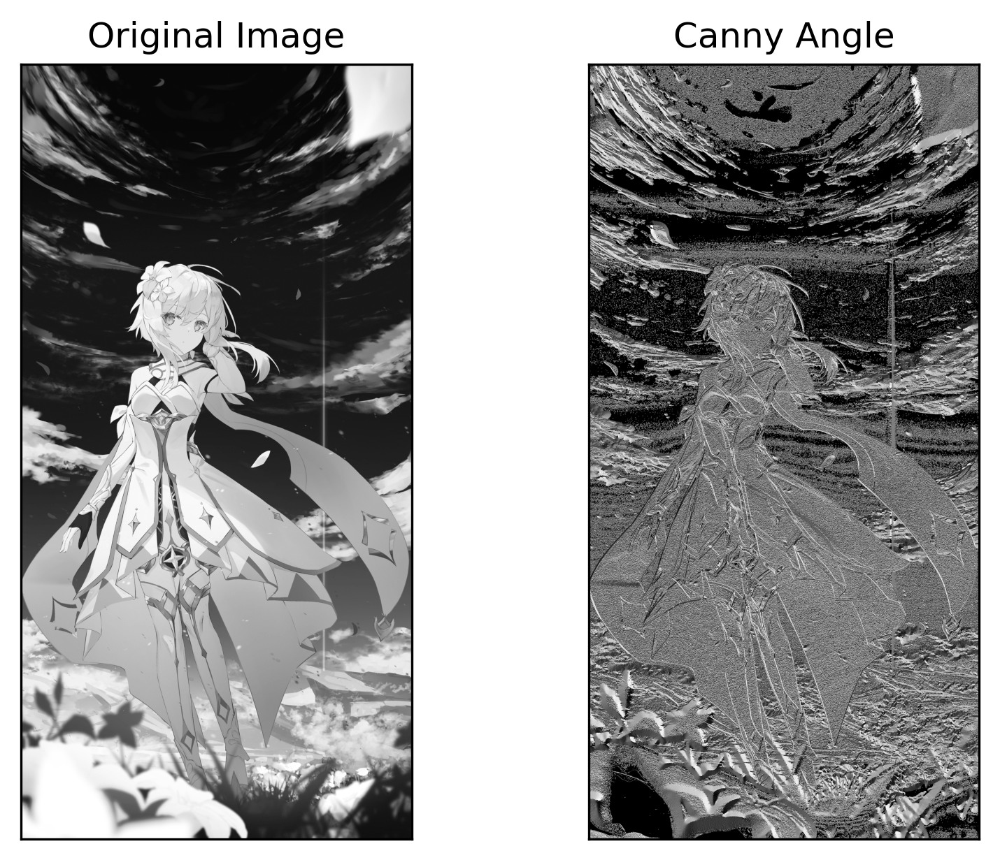

In [12]:
# 计算梯度幅值和角度
magnitude, angle = cv2.cartToPolar(gradient_x, gradient_y)

plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(gray_image, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(angle, cmap='gray')
plt.title('Canny Angle'), plt.xticks([]), plt.yticks([])

plt.show()

In [13]:
final_img = ed.nms(magnitude, angle)

plt.figure(dpi = 300)
plt.subplot(121), plt.imshow(cv_image, cmap = "gray")
plt.title('Original Image'), plt.xticks([]), plt.yticks([])

plt.subplot(122), plt.imshow(final_img, cmap='gray')
plt.title('My Edge'), plt.xticks([]), plt.yticks([])

plt.show()

AttributeError: module 'edge_detection' has no attribute 'nms'

In [ ]:
angle_quantized = np.round(angle_image / (np.pi/4)) % 4
aq = np.round(angle / (np.pi/4)) % 4
print(angle_quantized)
print(aq)